# Evaluation VGG16 Encoder-Decoder #
This notebook contains the evaluation of the VGG16 Encoder-Decoder.    
Models trained by "Misc", "Tampere" and "Combined" Dataset are evaluated against the "Constance" Dataset.    
The "Constance" Dataset is given in two resolutions (960x640 and 576x384)

Imports:

In [2]:
import time
import os, sys
dir2 = os.path.abspath('')
dir1 = os.path.dirname(dir2)
if not dir1 in sys.path: sys.path.insert(0, dir1)


import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision import transforms
from ummon import *


from models.vgg_encoder_decoder import VGGNet, FCN8s
from utils.water_segmentation import Water
from utils import metrics, dataset_statistics

from matplotlib import pyplot as plt
import numpy as np

# 1. Evaluation of model trained on "Tampere" only #
Load model:

In [3]:
# model
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
vgg_model = VGGNet(requires_grad=True, remove_fc=True, pretrained=False)
model = FCN8s(pretrained_net=vgg_model, n_class=1).to(device)

In [7]:
identifier = 'VGG16_Enc_Dec_Tamp_RMS_lr_e-4'
directory = "../data/training_states/VGG16_Enc_Dec"
state = "best_valid_loss.pth.tar"
path = os.path.join(directory,identifier + "_" + state)


# Load trained state in model
trs = Trainingstate()
trs.load_state_(path)
trs.load_weights_(model)
model = model.eval()

Prepare Test-Dataset:

In [8]:
# data loader 
# Get precalculated mean and standard deviation
mean, std = dataset_statistics.TAMP_OPEN_DOCK

# Transformation to normalize and unnormalize input images
norm = transforms.Normalize(mean, std)
inv_norm = transforms.Normalize(
   mean= [-m/s for m, s in zip(mean, std)],
   std= [1/s for s in std])

dataset_960_640 = Water('../data/WaterDataset', data_list_tamp=[], data_list_misc=[],
                    data_constance = True, transforms=norm, img_size=(960,640))

dataset_576_384 = Water('../data/WaterDataset', data_list_tamp=[], data_list_misc=[],
                    data_constance = True, transforms=norm, img_size=(576,384))

data_loader_960_640 = torch.utils.data.DataLoader(
        dataset_960_640, batch_size=1, shuffle=False, num_workers=4)

data_loader_576_384 = torch.utils.data.DataLoader(
        dataset_576_384, batch_size=1, shuffle=False, num_workers=4)

print(f'{len(dataset_960_640)} images in test dataset 960x640')
print(f'{len(dataset_576_384)} images in test dataset 576x384')

30 images in test dataset 960x640
30 images in test dataset 576x384


## Inference time: ##
### 960 x 640 ###

In [11]:
iterations = 100

# load 100 images in RAM
input_list = []
for i in range(iterations):
    input_list.append(dataset_960_640[i%20][0].unsqueeze(0))
# take time and start inference
t = time.perf_counter()
torch.cuda.synchronize() 
with torch.no_grad():
    for image in input_list:
        output=model(image.to(device))
        torch.cuda.synchronize() 
# calculate runtime
delta_t = time.perf_counter() - t
print("Time needed for single forward pass of 960x640 input :{:1.4f}".format(delta_t/iterations))

Time needed for single forward pass of 960x640 input :0.0583


### 576 x 384 ###

In [10]:
iterations = 100

#load 100 images in RAM
input_list = []
for i in range(iterations):
    input_list.append(dataset_576_384[i%20][0].unsqueeze(0))
t = time.perf_counter()
torch.cuda.synchronize() 
with torch.no_grad():
    for image in input_list:
        output=model(image.to(device))
        torch.cuda.synchronize() 
delta_t = time.perf_counter() - t
print("Time needed for single forward pass of 576x384 input :{:1.4f}".format(delta_t/iterations))

Time needed for single forward pass of 576x384 input :0.0226


## Performance on Test Set ("Constance"): ##
### 960 x 640 ###

In [12]:
from utils.segmentation_analyzer import SegmentationAnalyzer

loss = nn.BCEWithLogitsLoss()

ev = SegmentationAnalyzer.evaluate(model, loss, data_loader_960_640 )
print("Performance on test set: \nloss={:6.4f} \niou={:.4f} \nacc={:.4f} \nsensitivity={:.4f} \nspecificity={:.4f} \nprecision={:.4f} \nf1={:.4f}".format(
            ev["loss"], ev["iou"],ev["accuracy"], ev["sensitivity"], ev["specificity"], ev["precision"], ev["f1"]))

Performance on test set: 
loss=0.8373 
iou=0.6886 
acc=0.7804 
sensitivity=0.8697 
specificity=0.6636 
precision=0.7740 
f1=0.8093


### 576 x 384 ###

In [13]:
from utils.segmentation_analyzer import SegmentationAnalyzer

loss = nn.BCEWithLogitsLoss()

ev = SegmentationAnalyzer.evaluate(model, loss, data_loader_576_384)
print("Performance on test set: \nloss={:6.4f} \niou={:.4f} \nacc={:.4f} \nsensitivity={:.4f} \nspecificity={:.4f} \nprecision={:.4f} \nf1={:.4f}".format(
            ev["loss"], ev["iou"],ev["accuracy"], ev["sensitivity"], ev["specificity"], ev["precision"], ev["f1"]))

Performance on test set: 
loss=0.5798 
iou=0.7513 
acc=0.8454 
sensitivity=0.8404 
specificity=0.8417 
precision=0.8771 
f1=0.8510


## Predicted masks for Test Set: ##
### 960 x 640 ###

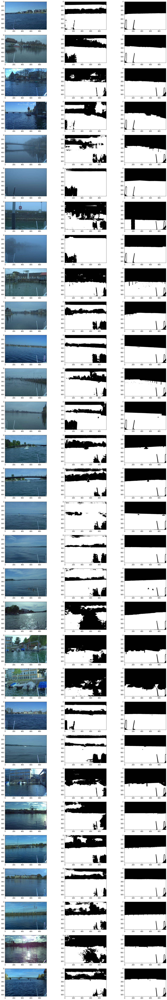

In [14]:
from utils.metrics import binarize

input_list = []
for i in range(30):
    input_list.append(dataset_960_640[i])
    
f, axs = plt.subplots(30,3,figsize=(20,120))

with torch.no_grad():
    j = 0
    for element in input_list:
        axs[j,0].imshow((np.transpose(inv_norm(element[0]),(1,2,0))*255).int())
        output=model(element[0].unsqueeze(0).to(device))
        output = binarize(torch.squeeze(output.data.cpu()), activation="sigmoid")
        axs[j,1].imshow(output, cmap='Greys_r')
        axs[j,2].imshow(element[1][0,:,:], cmap='Greys_r')
        j+=1   

### 576 x 384 ###

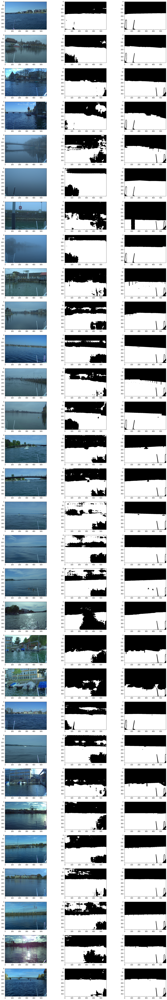

In [15]:
input_list = []
for i in range(30):
    input_list.append(dataset_576_384[i])
    
f, axs = plt.subplots(30,3,figsize=(20,120))

with torch.no_grad():
    j = 0
    for element in input_list:
        axs[j,0].imshow((np.transpose(inv_norm(element[0]),(1,2,0))*255).int())
        output=model(element[0].unsqueeze(0).to(device))
        output = binarize(torch.squeeze(output.data.cpu()), activation="sigmoid")
        axs[j,1].imshow(output, cmap='Greys_r')
        axs[j,2].imshow(element[1][0,:,:], cmap='Greys_r')
        j+=1   

# 2. Evaluation of model trained on "Misc" only #

Prepare Test-Dataset:

In [6]:
# data loader 
# Get precalculated mean and standard deviation
mean, std = dataset_statistics.MISC_TRAINING

# Transformation to normalize and unnormalize input images
norm = transforms.Normalize(mean, std)
inv_norm = transforms.Normalize(
   mean= [-m/s for m, s in zip(mean, std)],
   std= [1/s for s in std])

dataset_960_640 = Water('../data/WaterDataset', data_list_tamp=[], data_list_misc=[],
                    data_constance = True, transforms=norm, img_size=(960,640))

dataset_576_384 = Water('../data/WaterDataset', data_list_tamp=[], data_list_misc=[],
                    data_constance = True, transforms=norm, img_size=(576,384))

data_loader_960_640 = torch.utils.data.DataLoader(
        dataset_960_640, batch_size=1, shuffle=False, num_workers=4)

data_loader_576_384 = torch.utils.data.DataLoader(
        dataset_576_384, batch_size=1, shuffle=False, num_workers=4)

print(f'{len(dataset_960_640)} images in test dataset 960x640')
print(f'{len(dataset_576_384)} images in test dataset 576x384')

30 images in test dataset 960x640
30 images in test dataset 576x384


Load model:

In [14]:
identifier = 'VGG16_Enc_Dec_Misc_RMS_lr_e-4'
directory = "../data/training_states/VGG16_Enc_Dec"
state = "best_valid_loss.pth.tar"
path = os.path.join(directory,identifier + "_" + state)

# Load trained state in model
trs = Trainingstate()
trs.load_state_(path)
trs.load_weights_(model)
model = model.eval()

## Performance on Test Set ("Constance"): ##
### 960 x 640 ###

In [11]:
from utils.segmentation_analyzer import SegmentationAnalyzer

loss = nn.BCEWithLogitsLoss()

ev = SegmentationAnalyzer.evaluate(model, loss, data_loader_960_640 )
print("Performance on test set: \nloss={:6.4f} \niou={:.4f} \nacc={:.4f} \nsensitivity={:.4f} \nspecificity={:.4f} \nprecision={:.4f} \nf1={:.4f}".format(
            ev["loss"], ev["iou"],ev["accuracy"], ev["sensitivity"], ev["specificity"], ev["precision"], ev["f1"]))

Performance on test set: 
loss=0.1355 
iou=0.9004 
acc=0.9492 
sensitivity=0.9276 
specificity=0.9702 
precision=0.9675 
f1=0.9446


### 576 x 384 ###

In [12]:
from utils.segmentation_analyzer import SegmentationAnalyzer

loss = nn.BCEWithLogitsLoss()

ev = SegmentationAnalyzer.evaluate(model, loss, data_loader_576_384)
print("Performance on test set: \nloss={:6.4f} \niou={:.4f} \nacc={:.4f} \nsensitivity={:.4f} \nspecificity={:.4f} \nprecision={:.4f} \nf1={:.4f}".format(
            ev["loss"], ev["iou"],ev["accuracy"], ev["sensitivity"], ev["specificity"], ev["precision"], ev["f1"]))

Performance on test set: 
loss=0.1258 
iou=0.9020 
acc=0.9494 
sensitivity=0.9381 
specificity=0.9604 
precision=0.9600 
f1=0.9455


## Predicted masks for Test Set: ##

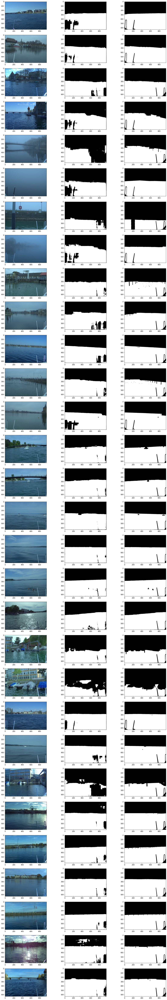

In [13]:
from utils.metrics import binarize

input_list = []
for i in range(30):
    input_list.append(dataset_960_640[i])
    
f, axs = plt.subplots(30,3,figsize=(20,120))

with torch.no_grad():
    j = 0
    for element in input_list:
        axs[j,0].imshow((np.transpose(inv_norm(element[0]),(1,2,0))*255).int())
        output=model(element[0].unsqueeze(0).to(device))
        output = binarize(torch.squeeze(output.data.cpu()), activation="sigmoid")
        axs[j,1].imshow(output, cmap='Greys_r')
        axs[j,2].imshow(element[1][0,:,:], cmap='Greys_r')
        j+=1  

In [16]:
state_dict = trs["model_state"]
torch.save(state_dict, directory+"/VGG16_Enc_Dec_Misc")

# 3. Evaluation of model trained on "Misc" and "Tampere"

Prepare Test-Dataset:

In [21]:
# data loader 
# Get precalculated mean and standard deviation
mean, std = dataset_statistics.TAMP_OPEN_DOCK_MISC_TRN

# Transformation to normalize and unnormalize input images
norm = transforms.Normalize(mean, std)
inv_norm = transforms.Normalize(
   mean= [-m/s for m, s in zip(mean, std)],
   std= [1/s for s in std])

dataset_960_640 = Water('../data/WaterDataset', data_list_tamp=[], data_list_misc=[],
                    data_constance = True, transforms=norm, img_size=(960,640))

dataset_576_384 = Water('../data/WaterDataset', data_list_tamp=[], data_list_misc=[],
                    data_constance = True, transforms=norm, img_size=(576,384))

data_loader_960_640 = torch.utils.data.DataLoader(
        dataset_960_640, batch_size=1, shuffle=False, num_workers=4)

data_loader_576_384 = torch.utils.data.DataLoader(
        dataset_576_384, batch_size=1, shuffle=False, num_workers=4)

print(f'{len(dataset_960_640)} images in test dataset 960x640')
print(f'{len(dataset_576_384)} images in test dataset 576x384')

30 images in test dataset 960x640
30 images in test dataset 576x384


Load model:

In [23]:
identifier = 'VGG16_Enc_Dec_Combined_RMS_lr_e-4'
directory = "../data/training_states/VGG16_Enc_Dec"
state = "best_valid_loss.pth.tar"
path = os.path.join(directory,identifier + "_" + state)


# Load trained state in model
trs = Trainingstate()
trs.load_state_(path)
trs.load_weights_(model)
model = model.eval()

## Performance on Test Set ("Constance"): ##
### 960 x 640 ###

In [24]:
from utils.segmentation_analyzer import SegmentationAnalyzer

loss = nn.BCEWithLogitsLoss()

ev = SegmentationAnalyzer.evaluate(model, loss, data_loader_960_640 )
print("Performance on test set: \nloss={:6.4f} \niou={:.4f} \nacc={:.4f} \nsensitivity={:.4f} \nspecificity={:.4f} \nprecision={:.4f} \nf1={:.4f}".format(
            ev["loss"], ev["iou"],ev["accuracy"], ev["sensitivity"], ev["specificity"], ev["precision"], ev["f1"]))

Performance on test set: 
loss=0.1779 
iou=0.8878 
acc=0.9370 
sensitivity=0.9438 
specificity=0.9227 
precision=0.9366 
f1=0.9373


### 576 x 384 ###

In [25]:
from utils.segmentation_analyzer import SegmentationAnalyzer

loss = nn.BCEWithLogitsLoss()

ev = SegmentationAnalyzer.evaluate(model, loss, data_loader_576_384)
print("Performance on test set: \nloss={:6.4f} \niou={:.4f} \nacc={:.4f} \nsensitivity={:.4f} \nspecificity={:.4f} \nprecision={:.4f} \nf1={:.4f}".format(
            ev["loss"], ev["iou"],ev["accuracy"], ev["sensitivity"], ev["specificity"], ev["precision"], ev["f1"]))

Performance on test set: 
loss=0.1827 
iou=0.9000 
acc=0.9399 
sensitivity=0.9565 
specificity=0.9149 
precision=0.9385 
f1=0.9442


## Predicted masks for Test Set: ##

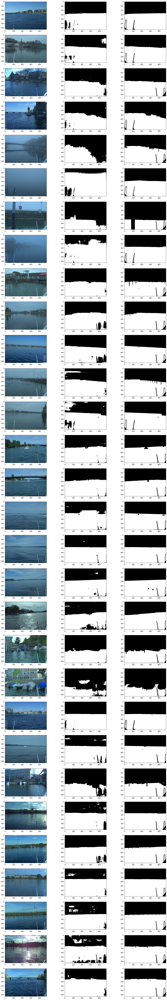

In [30]:
from utils.metrics import binarize

input_list = []
for i in range(30):
    input_list.append(dataset_960_640[i])
    
f, axs = plt.subplots(30,3,figsize=(20,120))

with torch.no_grad():
    j = 0
    for element in input_list:
        axs[j,0].imshow((np.transpose(inv_norm(element[0]),(1,2,0))*255).int())
        output=model(element[0].unsqueeze(0).to(device))
        output = binarize(torch.squeeze(output.data.cpu()), activation="sigmoid")
        axs[j,1].imshow(output, cmap='Greys_r')
        axs[j,2].imshow(element[1][0,:,:], cmap='Greys_r')
        j+=1  